<a href="https://colab.research.google.com/github/KaramAlmaghout/SurgicalToolsSegmentation/blob/main/AML_Assignment2_FasterRCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Applied Machine Learning - Assignment 2

### Train Mask RCNN (an extension of Faster RCNN) on a custom data using Detectron 2


**Karam Almaghout:**

k.almaghout@innopolis.university

# Install detectron2

In [1]:
!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

# Properly install detectron2. (Please do not install twice in both ways)
# !python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.1-cp310-cp310-linux_x86_64.whl size=44090 sha256=f9bbc69d90b2c562dea37150daf7f03de26e46da08df6ae2f7d48b03762e888e
  Stored in directory: /root/.cache/pip/wheels/70/83/31/975b737609aba39a4099d471d5684141c1fdc3404f97e7f68a
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
flax 0.6.9 requires PyYAML>=5.4.1, but you have pyyaml 5.1 which is incompatible.
dask 2022.12.1 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatibl

In [2]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
detectron2: 0.6


In [3]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Train on a custom dataset



## Prepare the dataset

In [4]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="Xbp6CtDn4FZ1jGn5BIlr")
project = rf.workspace("amlcourse").project("surgical-tools-detection-tjnkm")
dataset = project.version(1).download("coco")


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.2/56.2 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 682.2/682.2 kB 17.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9676 sha256=0af9f56cd608b09ceae0909e72280cd893018bb8ffa2dee91e201ab497330830
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 5.1
    Uninstalling PyYAML-5.1:
      Successfully uninstalled PyYAML-5.1
  Attempting uninstall: pyparsing
    F

loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to Surgical-Tools-Detection-1 in coco:: 100%|██████████| 540/540 [00:00<00:00, 1056.35it/s]


Register the balloon dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into detectron2's standard format. User should write such a function when using a dataset in custom format. See the tutorial for more details.


In [5]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/Surgical-Tools-Detection-1/train/_annotations.coco.json", "/content/Surgical-Tools-Detection-1/train")
register_coco_instances("my_dataset_val", {}, "/content/Surgical-Tools-Detection-1/valid/_annotations.coco.json", "/content/Surgical-Tools-Detection-1/valid")


## Train!


In [6]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train")
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  
cfg.SOLVER.IMS_PER_BATCH = 2  
cfg.SOLVER.BASE_LR = 0.0005
cfg.SOLVER.MAX_ITER = 4000   
cfg.SOLVER.STEPS = []        
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128 
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 7

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[04/28 07:16:49 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:00, 182MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[04/28 07:16:50 d2.engine.train_loop]: Starting training from iteration 0


torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)


[04/28 07:17:07 d2.utils.events]:  eta: 0:21:31  iter: 19  total_loss: 3.516  loss_cls: 2.215  loss_box_reg: 0.5653  loss_mask: 0.6948  loss_rpn_cls: 0.03185  loss_rpn_loc: 0.01047    time: 0.3334  last_time: 0.3094  data_time: 0.0230  last_data_time: 0.0050   lr: 9.9905e-06  max_mem: 1767M
[04/28 07:17:19 d2.utils.events]:  eta: 0:21:46  iter: 39  total_loss: 3.151  loss_cls: 1.812  loss_box_reg: 0.6674  loss_mask: 0.6934  loss_rpn_cls: 0.03879  loss_rpn_loc: 0.01304    time: 0.3980  last_time: 0.3667  data_time: 0.0118  last_data_time: 0.0084   lr: 1.998e-05  max_mem: 1767M
[04/28 07:17:25 d2.utils.events]:  eta: 0:21:25  iter: 59  total_loss: 2.695  loss_cls: 1.221  loss_box_reg: 0.6664  loss_mask: 0.6899  loss_rpn_cls: 0.02763  loss_rpn_loc: 0.01001    time: 0.3721  last_time: 0.3193  data_time: 0.0092  last_data_time: 0.0050   lr: 2.997e-05  max_mem: 1767M
[04/28 07:17:33 d2.utils.events]:  eta: 0:21:59  iter: 79  total_loss: 2.243  loss_cls: 0.8129  loss_box_reg: 0.6559  loss_mas

In [7]:
# Look at training curves in tensorboard:
%reload_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the balloon validation dataset. First, let's create a predictor using the model we just trained:



In [8]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[04/28 07:39:52 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


Then, we randomly select several samples to visualize the prediction results.

/content/Surgical-Tools-Detection-1/valid/v08_036950_jpg.rf.cfe66d8f52ee03c9d12b44fbb863bc6b.jpg


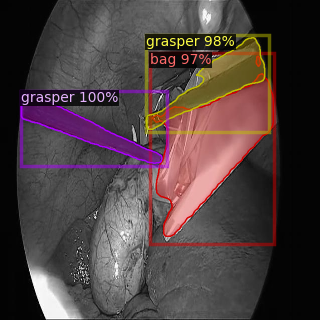

/content/Surgical-Tools-Detection-1/valid/v08_036450_jpg.rf.acd37cbfc91168ba7f67d3a08954857a.jpg


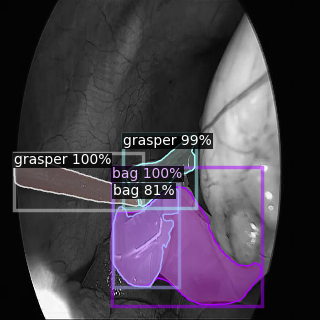

/content/Surgical-Tools-Detection-1/valid/v06_043100_jpg.rf.f74f37ff6c2b7a095cd4e7572e804e82.jpg


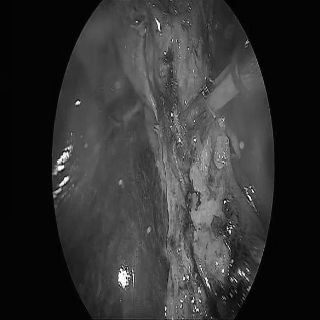

/content/Surgical-Tools-Detection-1/valid/v08_006375_jpg.rf.8f5c524696977d818d9f96d163dfd73f.jpg


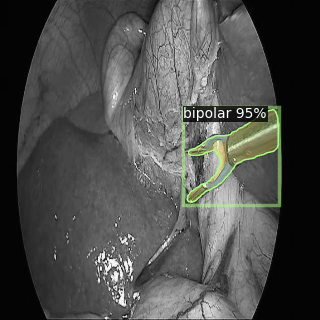

/content/Surgical-Tools-Detection-1/valid/v10_032475_jpg.rf.049ac004ded2bf43283040910031ae22.jpg


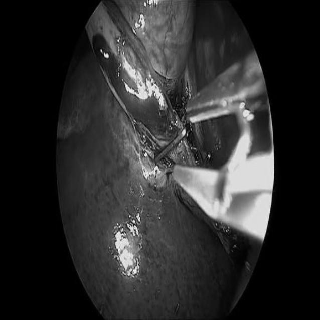

/content/Surgical-Tools-Detection-1/valid/v07_033475_jpg.rf.ce07c1fd52fb64603b009f8b33aeac82.jpg


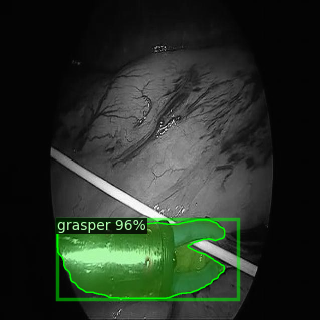

/content/Surgical-Tools-Detection-1/valid/v06_058050_jpg.rf.898bae95bc766d73fa1c2e5de8d6c059.jpg


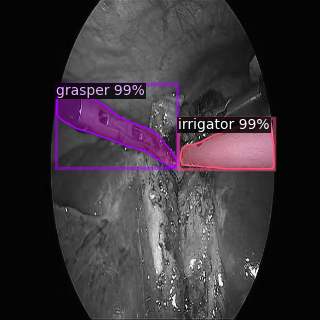

/content/Surgical-Tools-Detection-1/valid/v04_013800_jpg.rf.63caeb93b961799ce3260b31c2e0dcfa.jpg


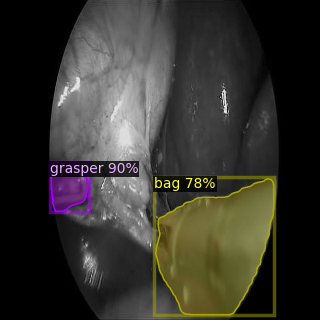

/content/Surgical-Tools-Detection-1/valid/v07_018500_jpg.rf.1d288b96bc56bfc7baf02ab4bc41445d.jpg


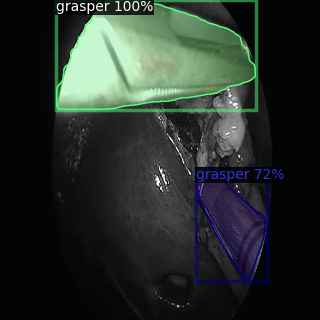

/content/Surgical-Tools-Detection-1/valid/v03_083400_jpg.rf.4ebe64070c806b0527f718609e4579da.jpg


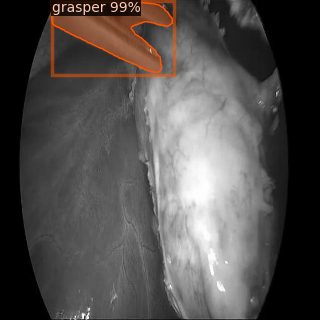

/content/Surgical-Tools-Detection-1/valid/v08_006950_jpg.rf.077a79f98e51f5a8147ea4981178ee79.jpg


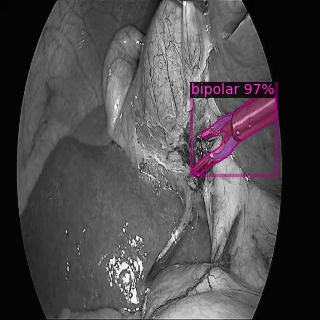

/content/Surgical-Tools-Detection-1/valid/v02_012475_jpg.rf.d77c18f5ef2b256c7b07126cf9cb7d53.jpg


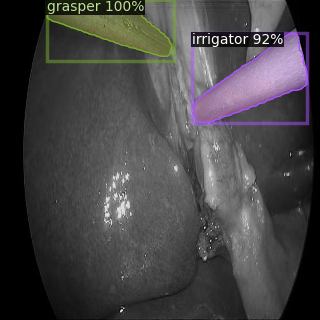

/content/Surgical-Tools-Detection-1/valid/v03_046875_jpg.rf.dce66bc9c40df88713041d770ab92b3d.jpg


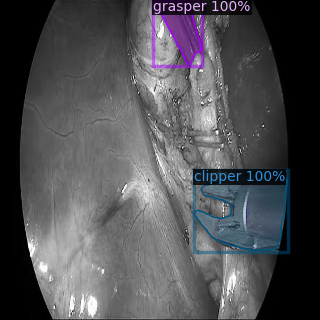

/content/Surgical-Tools-Detection-1/valid/v10_023225_jpg.rf.9cc4784931379bb0b3b131cc4b590a29.jpg


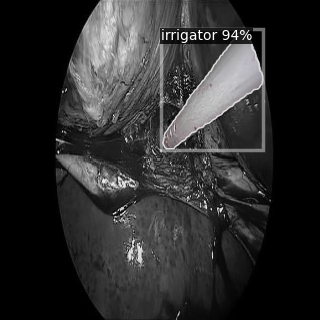

/content/Surgical-Tools-Detection-1/valid/v03_111875_jpg.rf.19e5af938ed49f27969c12ced636ba4e.jpg


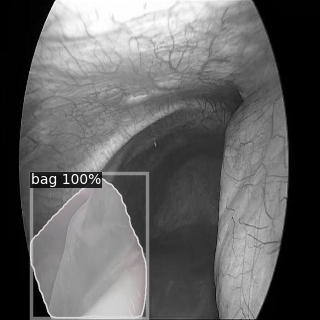

/content/Surgical-Tools-Detection-1/valid/v05_031075_jpg.rf.ef335f73de17f94d0076c83aa7844ccd.jpg


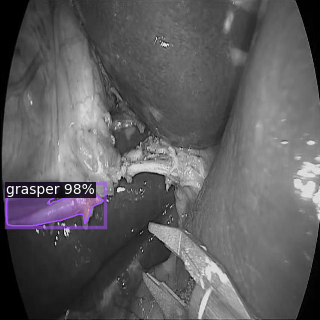

/content/Surgical-Tools-Detection-1/valid/v05_056075_jpg.rf.ef957fde5babb594ee150bdddd87b125.jpg


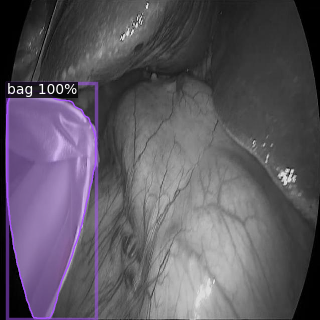

/content/Surgical-Tools-Detection-1/valid/v08_017725_jpg.rf.a9e46031110a530de6b20a89febe2feb.jpg


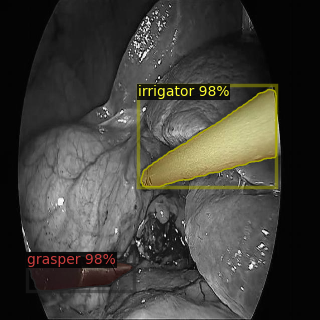

/content/Surgical-Tools-Detection-1/valid/v05_046600_jpg.rf.6b43c57d208a9f60f6b60f7badcf65a8.jpg


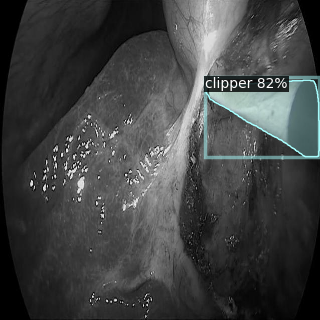

/content/Surgical-Tools-Detection-1/valid/v03_105400_jpg.rf.b4dd74cc4c82beefbad0778bae98e6ed.jpg


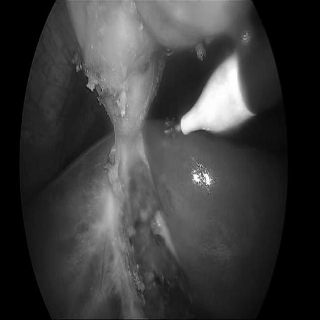

/content/Surgical-Tools-Detection-1/valid/v10_035125_jpg.rf.abd6b413b0bd64254e8377b9ad23207c.jpg


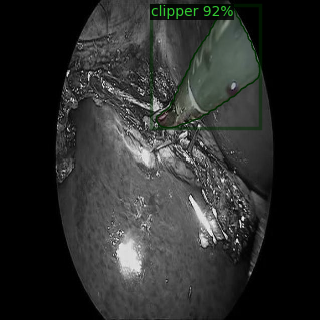

/content/Surgical-Tools-Detection-1/valid/v02_031600_jpg.rf.9019323d92eee48511245725b832ec95.jpg


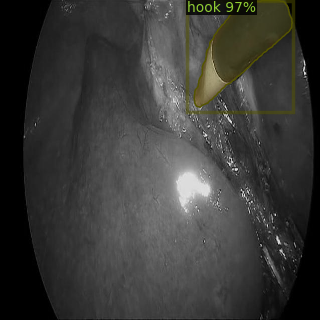

/content/Surgical-Tools-Detection-1/valid/v08_020975_jpg.rf.c1d1f5348891120672f1521e1d70d12d.jpg


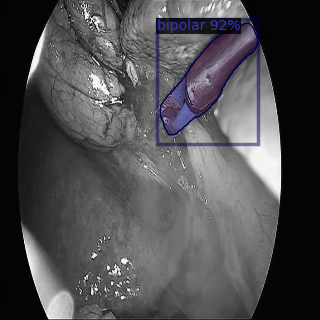

/content/Surgical-Tools-Detection-1/valid/v02_045225_jpg.rf.082d8f5a62404b584f6afd5903a974fe.jpg


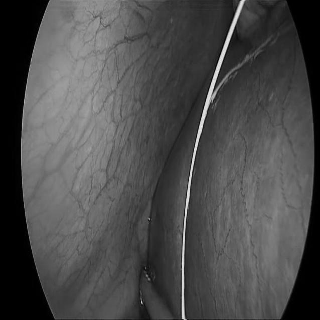

/content/Surgical-Tools-Detection-1/valid/v06_055650_jpg.rf.691e03ff295aff3393aacf2234cdf743.jpg


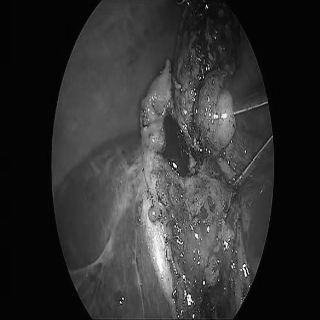

/content/Surgical-Tools-Detection-1/valid/v10_018900_jpg.rf.ad3ccf5f1545c5f662a601b468b25bcb.jpg


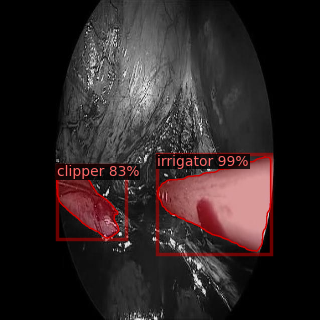

/content/Surgical-Tools-Detection-1/valid/v01_025150_jpg.rf.a7781d9d0cfcaef2b53f5d597c9b8bea.jpg


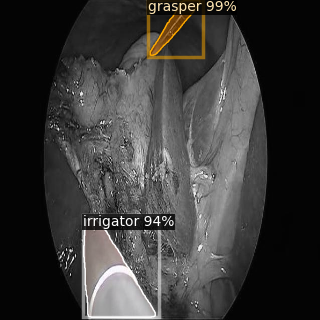

/content/Surgical-Tools-Detection-1/valid/v03_054600_jpg.rf.62e1828fe2830f9173108f26b2ac2cb3.jpg


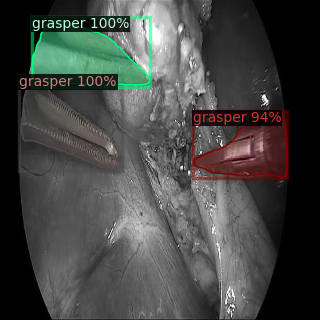

/content/Surgical-Tools-Detection-1/valid/v08_018450_jpg.rf.be98a6e67466006bfd15d0a8009478da.jpg


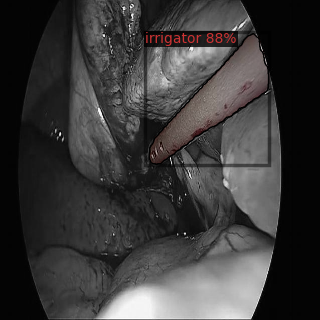

/content/Surgical-Tools-Detection-1/valid/v03_054675_jpg.rf.c23510b345c97bedd64ab24801e9efd3.jpg


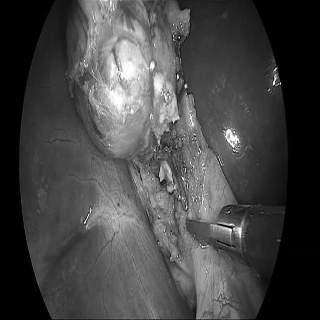

/content/Surgical-Tools-Detection-1/valid/v07_019475_jpg.rf.41cf9e71f1719d886d8759e898814abd.jpg


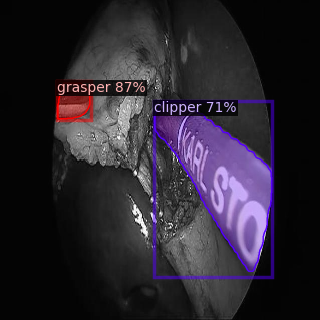

/content/Surgical-Tools-Detection-1/valid/v03_106925_jpg.rf.640522cff615e438a42b058b1aa28047.jpg


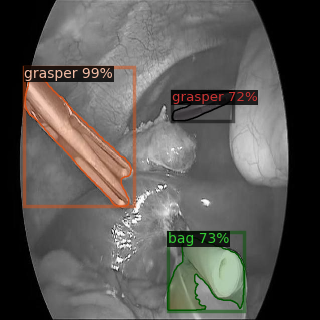

/content/Surgical-Tools-Detection-1/valid/v10_006475_jpg.rf.a903a53d91dcf47263a6276bcc2939f2.jpg


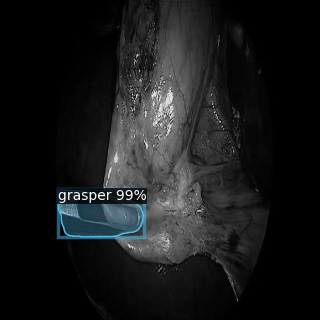

/content/Surgical-Tools-Detection-1/valid/v02_040800_jpg.rf.5cae76f27ce242fee5a2f9c5a2c60317.jpg


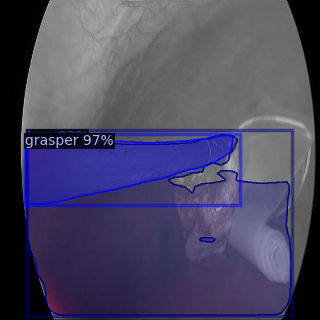

/content/Surgical-Tools-Detection-1/valid/v05_032225_jpg.rf.b9aecb630d00131f15f3007ef39d5d14.jpg


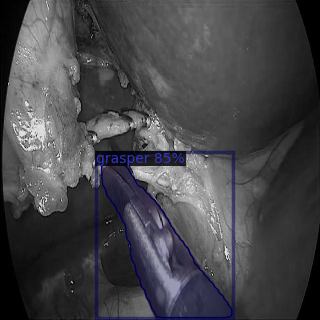

/content/Surgical-Tools-Detection-1/valid/v01_054850_jpg.rf.4010622317f368455388be241e187ae4.jpg


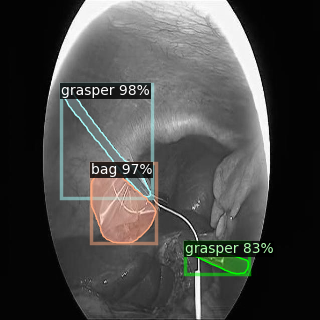

/content/Surgical-Tools-Detection-1/valid/v03_112250_jpg.rf.574f9836edb65b07753cdedada233119.jpg


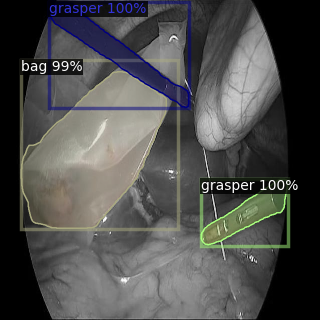

/content/Surgical-Tools-Detection-1/valid/v03_112600_jpg.rf.7ec6853ac557330150942347bb5c59dc.jpg


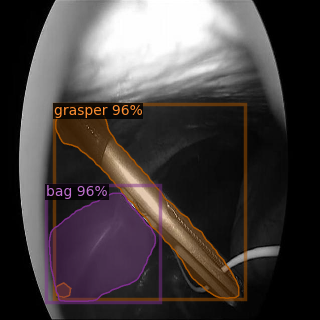

/content/Surgical-Tools-Detection-1/valid/v08_020600_jpg.rf.f71e21f48f1b28f368cd16b6fc163c3f.jpg


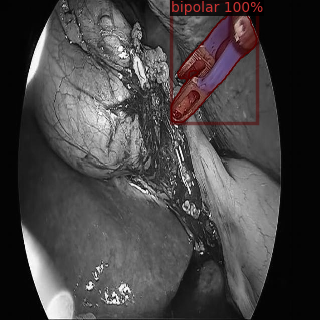

/content/Surgical-Tools-Detection-1/valid/v09_046575_jpg.rf.24aa2011f94045f654fc2c3f5e19e7eb.jpg


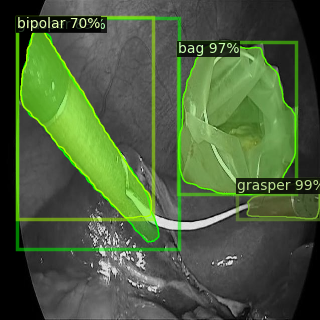

/content/Surgical-Tools-Detection-1/valid/v02_020925_jpg.rf.e4ad53cb563ece09748ef5f1984a7a4f.jpg


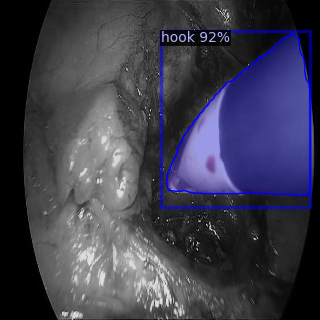

In [9]:
from detectron2.utils.visualizer import ColorMode
import glob
mydata_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = "/content/Surgical-Tools-Detection-1/valid/*.jpg"
for d in glob.glob(dataset_dicts):  
    print(d)
    im = cv2.imread(d)
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=mydata_metadata, 
                   scale=0.5, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

We can also evaluate its performance using AP metric implemented in COCO API.
This gives an AP of ~70. Not bad!

In [10]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_val", output_dir="./output")
val_loader = build_detection_test_loader(cfg, "my_dataset_val")
print(inference_on_dataset(predictor.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[04/28 07:40:07 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [04/28 07:40:07 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[04/28 07:40:07 d2.data.datasets.coco]: Loaded 41 images in COCO format from /content/Surgical-Tools-Detection-1/valid/_annotations.coco.json
[04/28 07:40:07 d2.data.build]: Distribution of instances among all 8 categories:
|   category    | #instances   |  category  | #instances   |  category  | #instances   |
|:-------------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| surgical-to.. | 0            |    bag     | 10           |  bipolar   | 6            |
|    clipper    | 5            |  grasper   | 27           |    hook    | 4            |
|   irrigator   | 7            |  scissors  | 5            |            |              |
|     total     | 64           |            |              |            |       